In [9]:
!pip install koreanize-matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 17.9 MB/s eta 0:00:00


In [10]:
import random
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import koreanize_matplotlib

import seaborn as sns

In [2]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [3]:
path = '/content/gdrive/MyDrive/book'
train = pd.read_csv(f'{path}/train.csv')
test = pd.read_csv(f'{path}/test.csv')
ans = f'{path}/sample_submission.csv'

In [4]:
train

,ID,User-ID,Book-ID,Book-Rating,Age,Location,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,TRAIN_000000,USER_00000,BOOK_044368,8,23.0,"sackville, new brunswick, canada",Road Taken,Rona Jaffe,2001.0,Mira
1,TRAIN_000001,USER_00000,BOOK_081205,8,23.0,"sackville, new brunswick, canada",Macbeth (New Penguin Shakespeare),William Shakespeare,1981.0,Penguin Books
2,TRAIN_000002,USER_00000,BOOK_086781,0,23.0,"sackville, new brunswick, canada",Waverley (Penguin English Library),Walter Scott,1981.0,Penguin Books
3,TRAIN_000003,USER_00000,BOOK_098622,0,23.0,"sackville, new brunswick, canada",Mother Earth Father Sky,Sue Harrison,1991.0,Avon
4,TRAIN_000004,USER_00000,BOOK_180810,8,23.0,"sackville, new brunswick, canada",She Who Remembers,Linda Lay Shuler,1989.0,Signet Book
...,...,...,...,...,...,...,...,...,...,...
871388,TRAIN_871388,USER_92096,BOOK_081138,0,34.0,"minneapolis, minnesota, usa",Healing Words: The Power of Prayer and the Pra...,Larry Dossey,1993.0,Harpercollins
871389,TRAIN_871389,USER_92097,BOOK_258124,0,35.0,"temple, texas, usa",The Salmon of Doubt: Hitchhiking the Galaxy On...,DOUGLAS ADAMS,2002.0,Harmony
871390,TRAIN_871390,USER_92098,BOOK_071848,0,45.0,"ottawa, ontario, canada",Harry Potter and the Prisoner of Azkaban (Book 3),J. K. Rowling,2000.0,Thorndike Press
871391,TRAIN_871391,USER_92099,BOOK_252599,8,43.0,"maple grove, minnesota, usa",Heartbreak Hill: Anatomy of a Ryder Cup,Tim Rosaforte,1996.0,St Martins Pr


In [5]:
train.isnull().sum()

ID                     0
User-ID                0
Book-ID                0
Book-Rating            0
Age                    0
Location               0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
dtype: int64

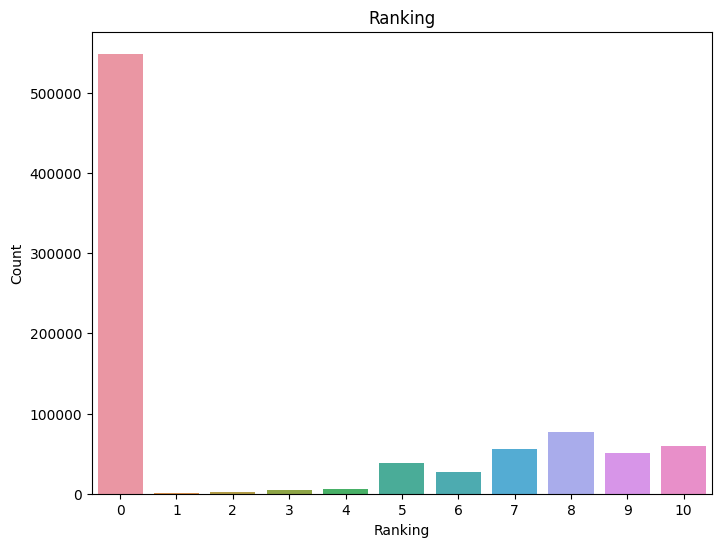

In [6]:
br = train['Book-Rating'].value_counts().reset_index()

br.columns = ['value', 'count']

fig, ax = plt.subplots(figsize=(8, 6))
sns.barplot(x='value', y='count', data=br, ax=ax)
ax.set_title('Ranking')
ax.set_xlabel('Ranking')
ax.set_ylabel('Count')
plt.show()

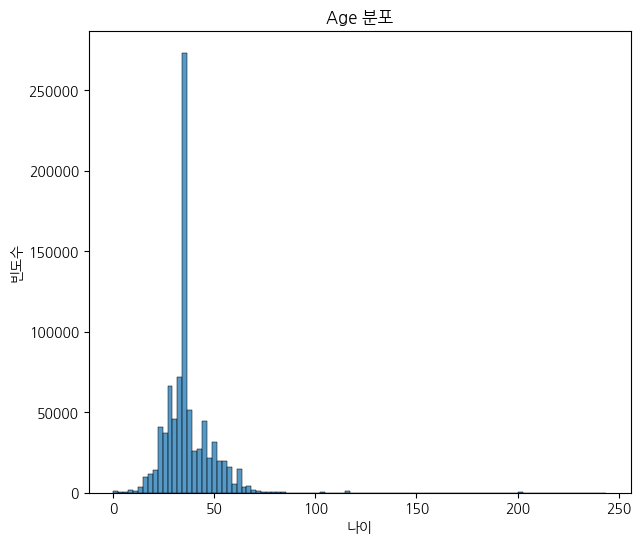

In [11]:
plt.figure(figsize=(7, 6))
sns.histplot(train['Age'], bins=100)
plt.title('Age 분포')
plt.xlabel('나이')
plt.ylabel('빈도수')
plt.show()

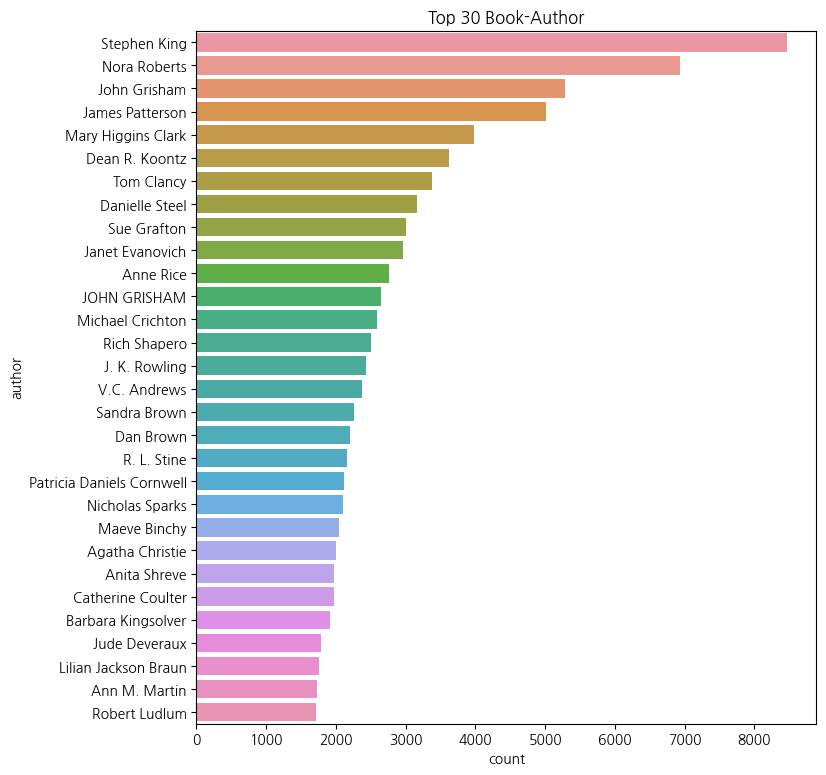

In [18]:
ds = train['Book-Author'].value_counts().reset_index()
ds.columns = ['author', 'count']
ds = ds.sort_values('count', ascending=False).head(30)

plt.figure(figsize=(8, 9))
sns.barplot(x='count', y='author', data=ds, orient='h')
plt.title('Top 30 Book-Author')
plt.show()

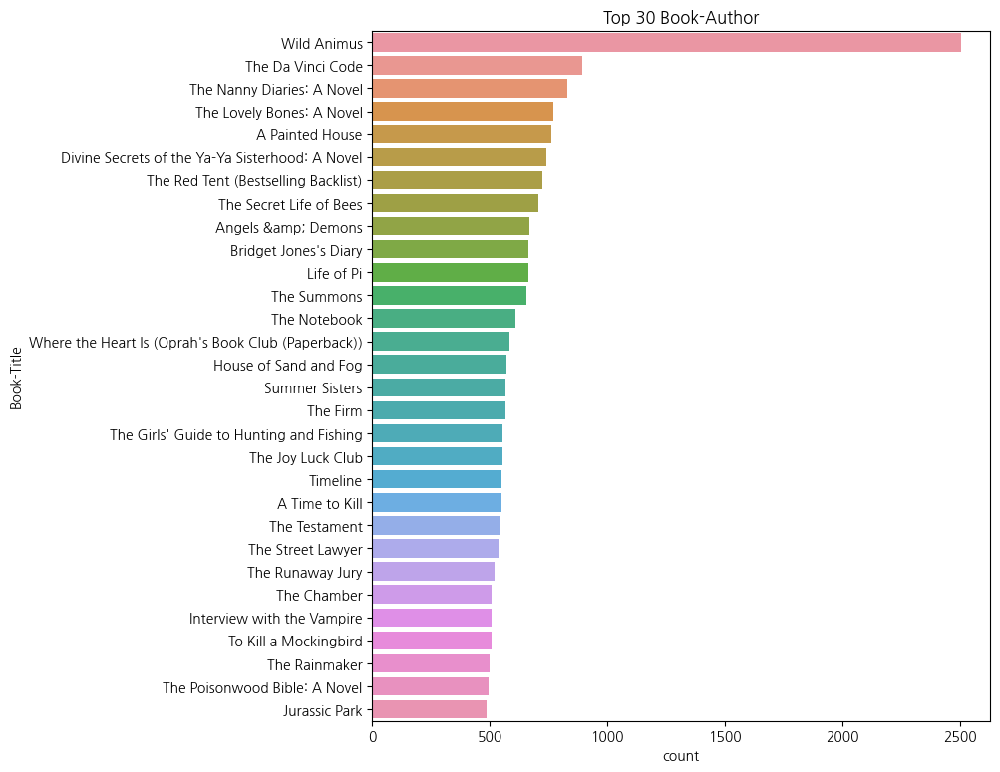

In [19]:
ds = train['Book-Title'].value_counts().reset_index()
ds.columns = ['Book-Title', 'count']
ds = ds.sort_values('count', ascending=False).head(30)

plt.figure(figsize=(8, 9))
sns.barplot(x='count', y='Book-Title', data=ds, orient='h')
plt.title('Top 30 Book-Author')
plt.show()

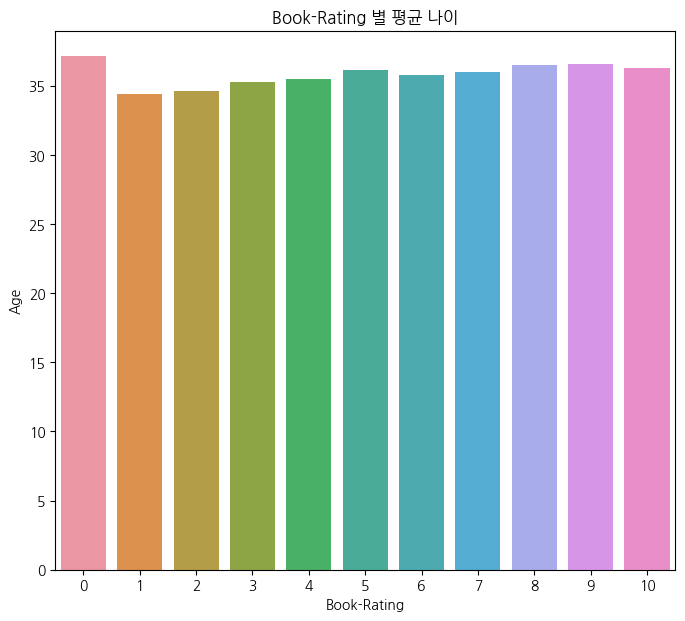

In [20]:
data = train.groupby('Book-Rating')['Age'].mean().reset_index()

plt.figure(figsize=(8,7))
sns.barplot(x='Book-Rating', y='Age', data=data)
plt.title('Book-Rating 별 평균 나이')
plt.show()

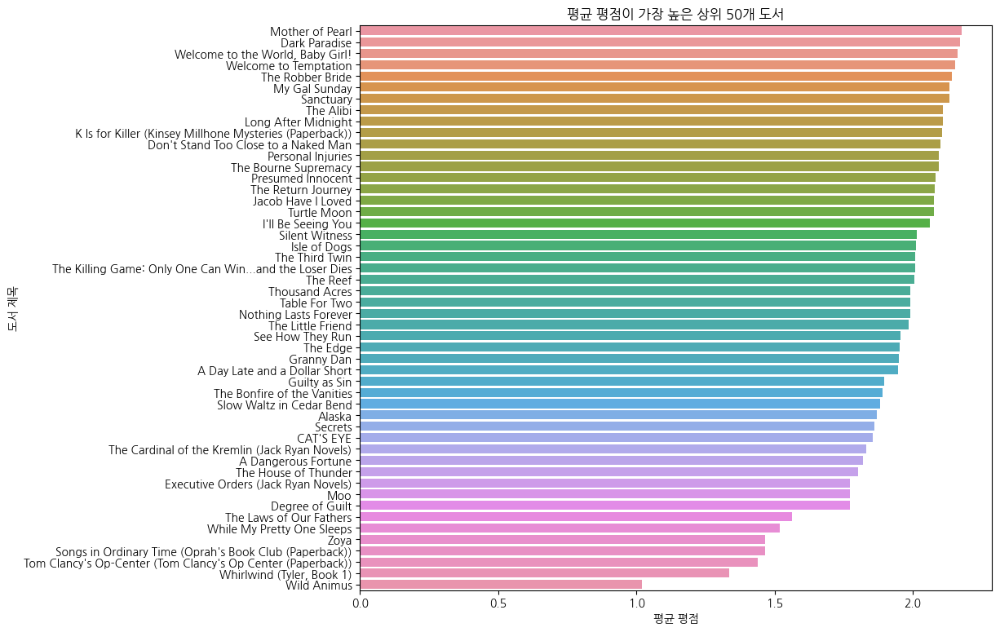

In [21]:
books = train['Book-Title'].value_counts().reset_index()
books.columns = ['Book-Title', 'book_evaluation_count']
df = pd.merge(train, books)
mean_df = df[df['book_evaluation_count']>100]
mean_df = mean_df.groupby('Book-Title')['Book-Rating'].mean().reset_index().sort_values('Book-Rating', ascending=False)

plt.figure(figsize=(10, 9))
sns.barplot(data=mean_df.tail(50), x='Book-Rating', y='Book-Title')
plt.title('평균 평점이 가장 높은 상위 50개 도서')
plt.xlabel('평균 평점')
plt.ylabel('도서 제목')
plt.show()

In [22]:
from wordcloud import WordCloud, STOPWORDS

stopwords = set(STOPWORDS)
cross_author_string = " ".join(train['Book-Author'].astype(str))
cross_title_string = " ".join(train['Book-Title'].astype(str))
cross_publisher_string = " ".join(train['Publisher'].astype(str))

In [23]:
cross_author_string

'Rona Jaffe William Shakespeare Walter Scott Sue Harrison Linda Lay Shuler William Gibson Antoine de Saint-ExupÃ©ry Charles de Lint Phillip C. McGraw Phillip C. McGraw Paul, Dr. Meier Bret Lott Daniel L. Schacter Arthur C. Clarke John Grisham Susanne FrÃ?Â¶hlich Guido Knopp Andrew Solomon Katya Reimann Robin Cook Jostein Gaarder John Grisham John Grisham JOHN GRISHAM John Grisham Arthur C. Clarke JOHN GRISHAM John Grisham John Grisham Walter Moers Walter Moers John Grisham John Grisham Arthur C. Clarke Rose Tremain Ian McEwan Louisa Ermelino Sheri Holman Alan Cumming Tim Farrington JENNIFER EGAN Anthony Bourdain Anita Shreve RITA CIRESI Stefan Zweig Rae Lawrence Jonathan Kellerman Judith Michael Lawrence Sanders Tess Gerritsen Jude Deveraux Frank Peretti Nora Roberts Fern Michaels Harlan Coben James Patterson Faye Kellerman Stephen King Dean R. Koontz Eric Schlosser Mary Higgins Clark Mo Hayder Jake Logan Antonio Skarmeta Zeruya Shalev Barbara Wood Uta Hess Robert Ludlum Richard Russo 

In [25]:
def wordcloud(string):
    wc = WordCloud(width=800,height=500,mask=None,random_state=21, max_font_size=110,stopwords=stopwords).generate(string)
    fig=plt.figure(figsize=(16,8))
    plt.axis('off')
    plt.imshow(wc)

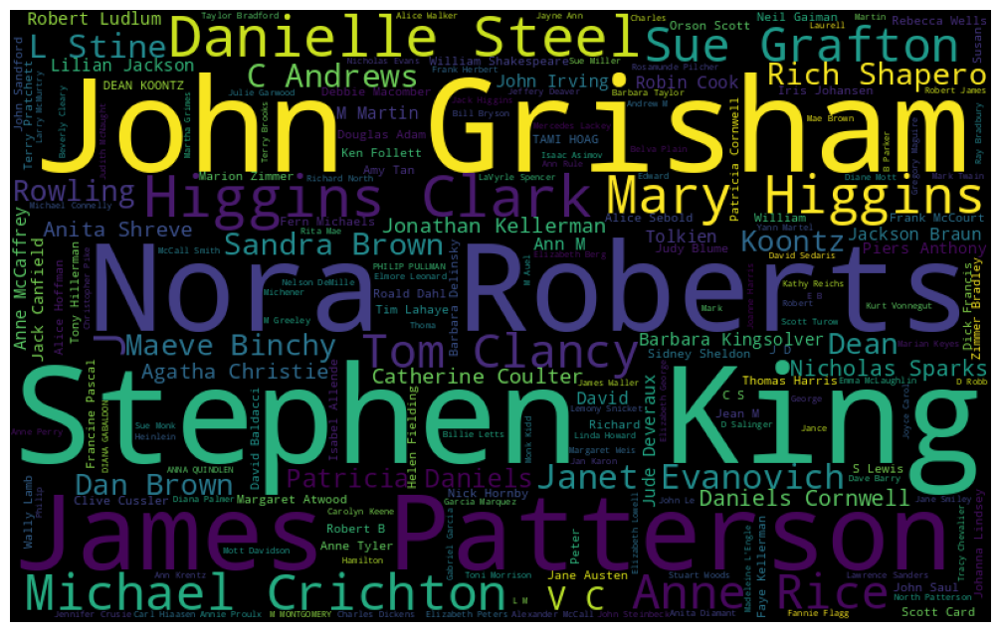

In [26]:
wordcloud(cross_author_string)

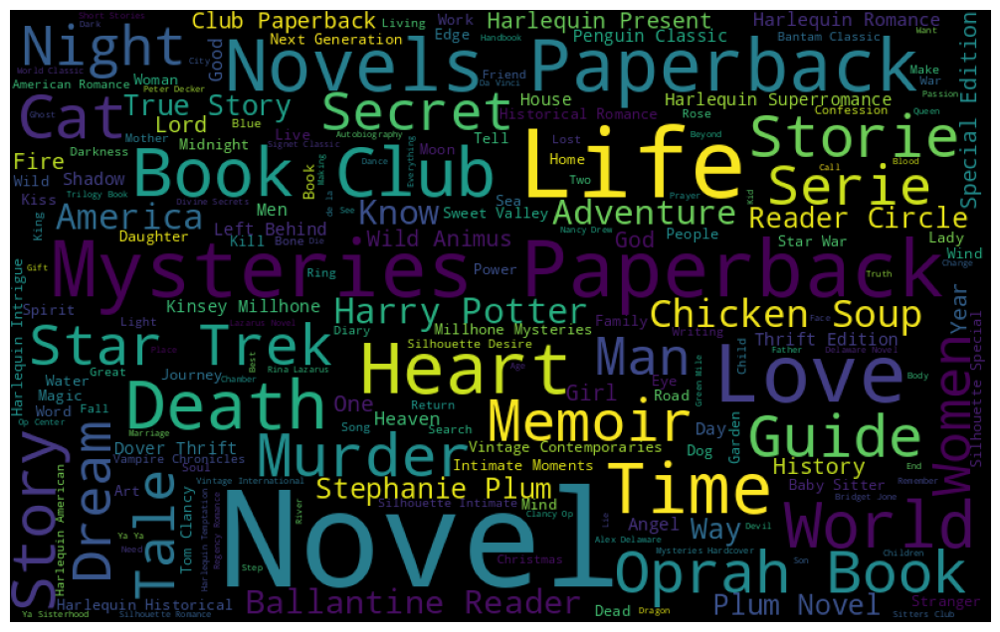

In [27]:
wordcloud(cross_title_string)

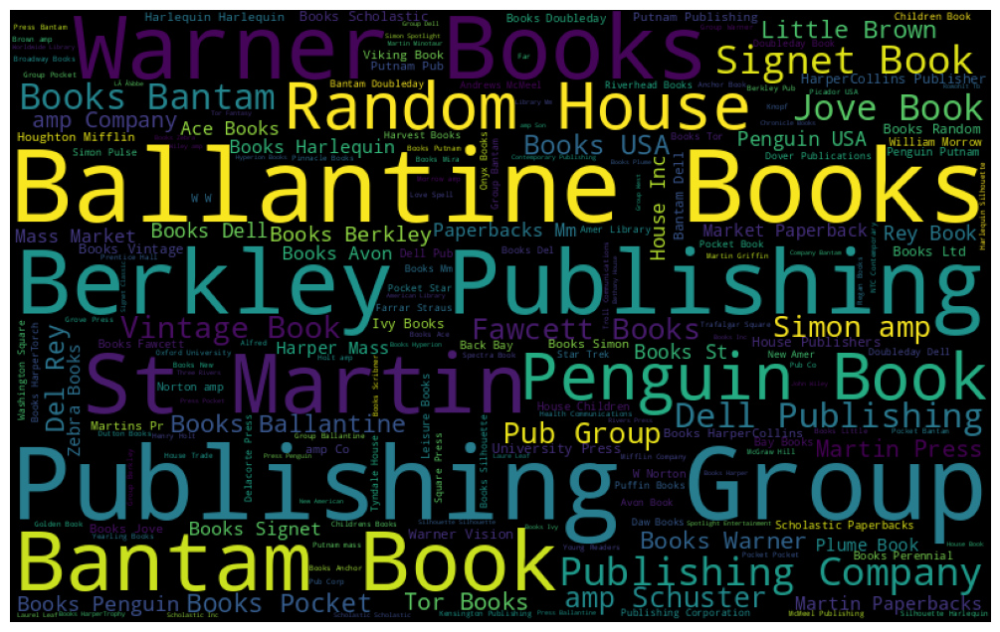

In [28]:
wordcloud(cross_publisher_string)